In [1]:
import cv2
from matplotlib import pyplot as plt
print("input a picture of either .jpg or .png format")

input a picture of either .jpg or .png format


In [2]:
image_file = "page_01.jpg"
img = cv2.imread(image_file)

In [3]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

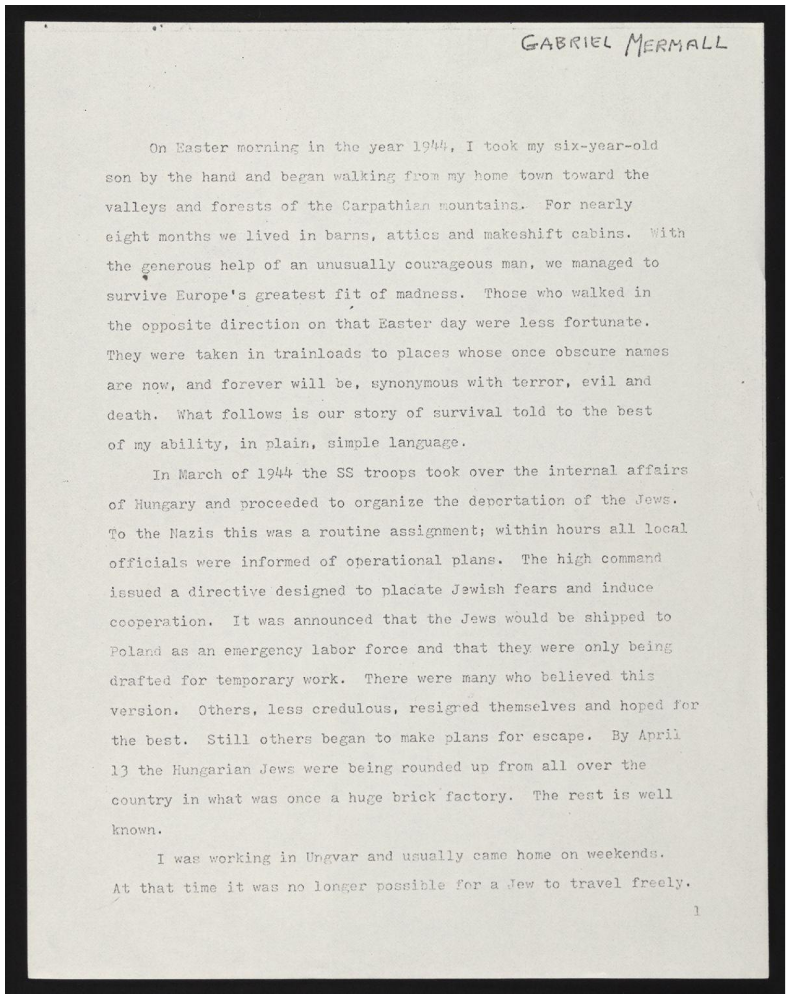

In [4]:
display(image_file)

In [5]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("inverted.jpg", inverted_image)

True

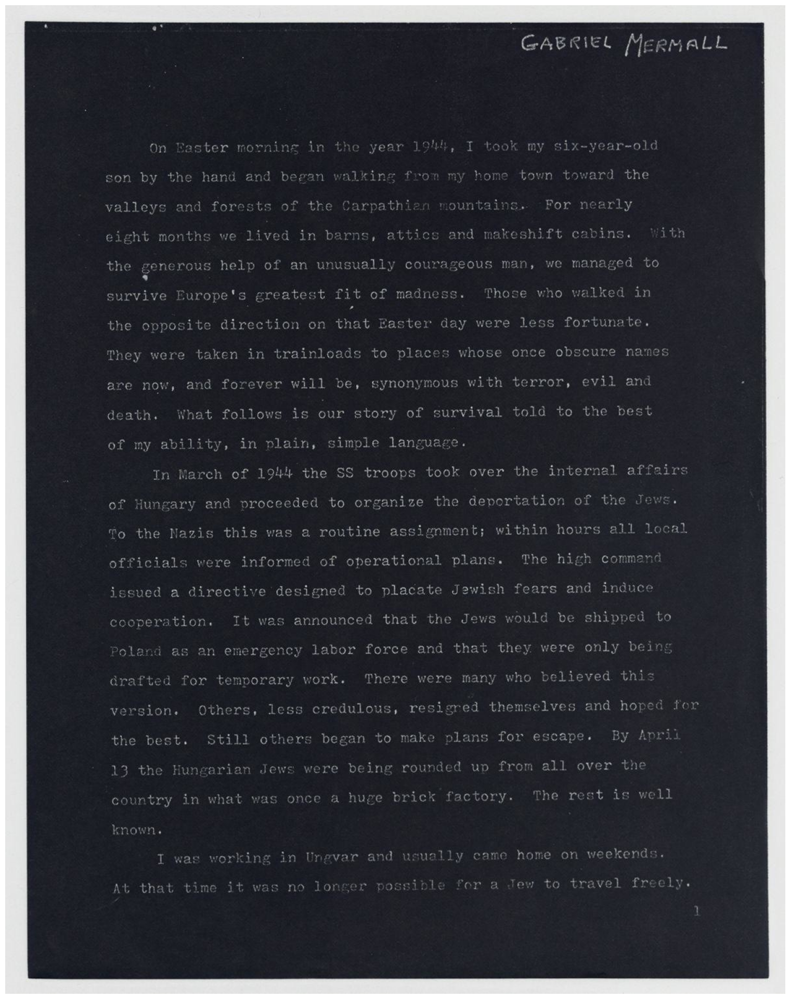

In [6]:
display("inverted.jpg")

In [7]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [8]:
gray_image = grayscale(img)
cv2.imwrite("gray.jpg", gray_image)

True

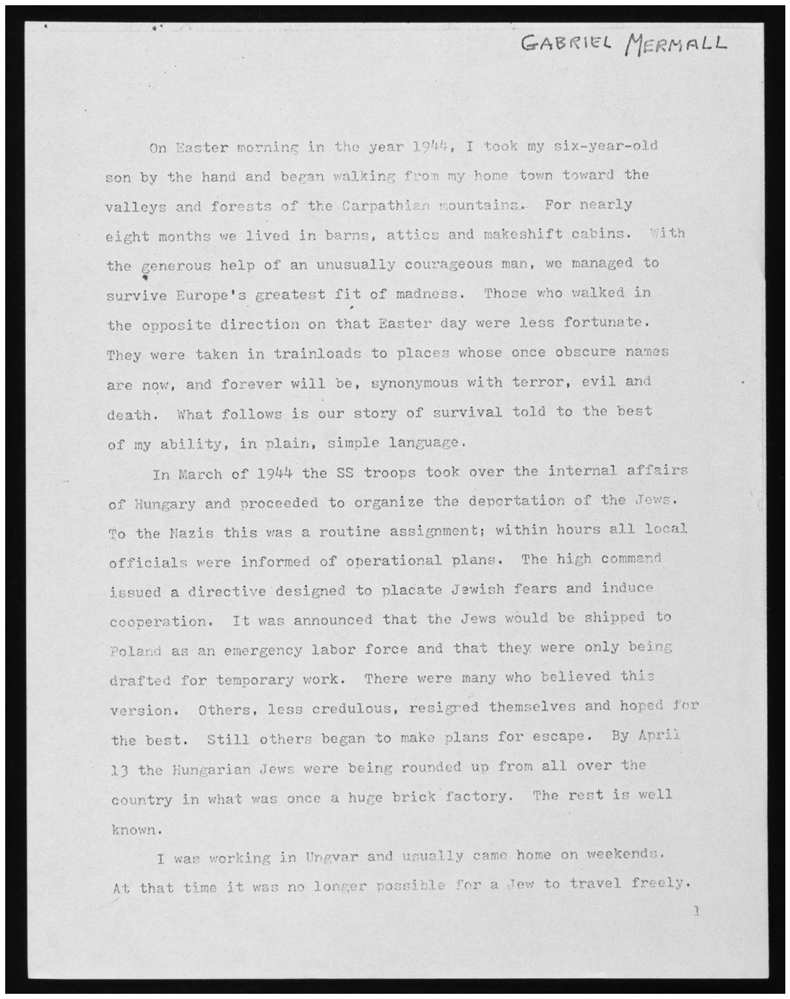

In [9]:
display("gray.jpg")

In [10]:
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("bw_image.jpg", im_bw)
#blackwhite

True

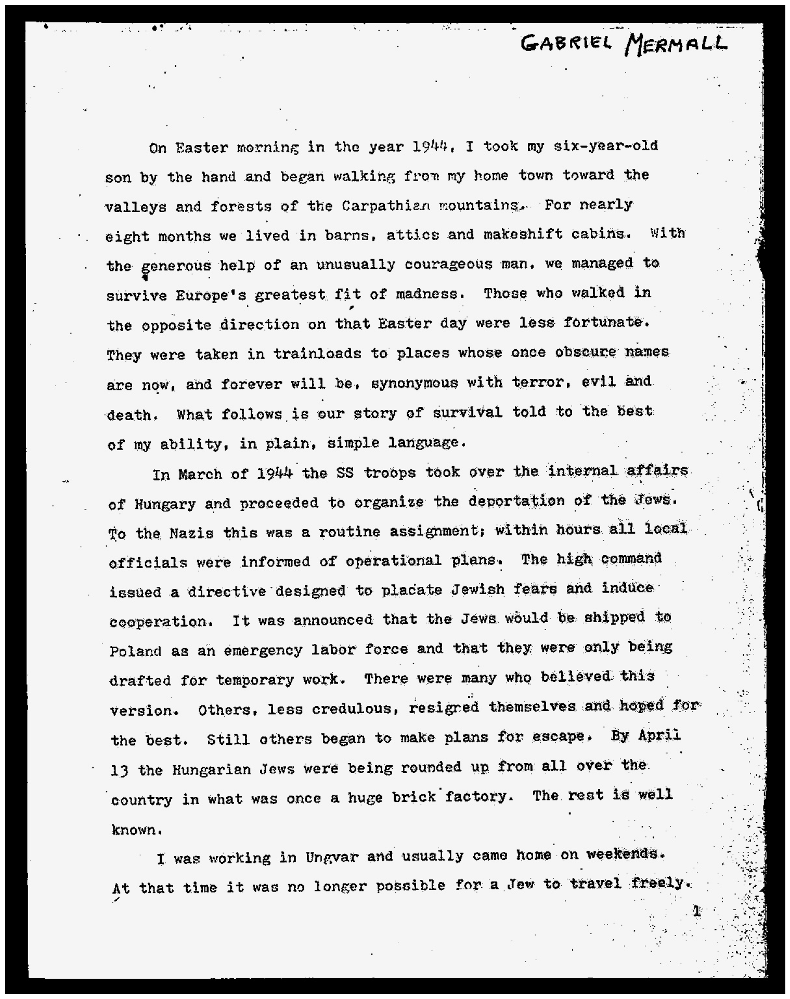

In [11]:
display("bw_image.jpg")

In [12]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [13]:
no_noise = noise_removal(im_bw)
cv2.imwrite("no_noise.jpg", no_noise)

True

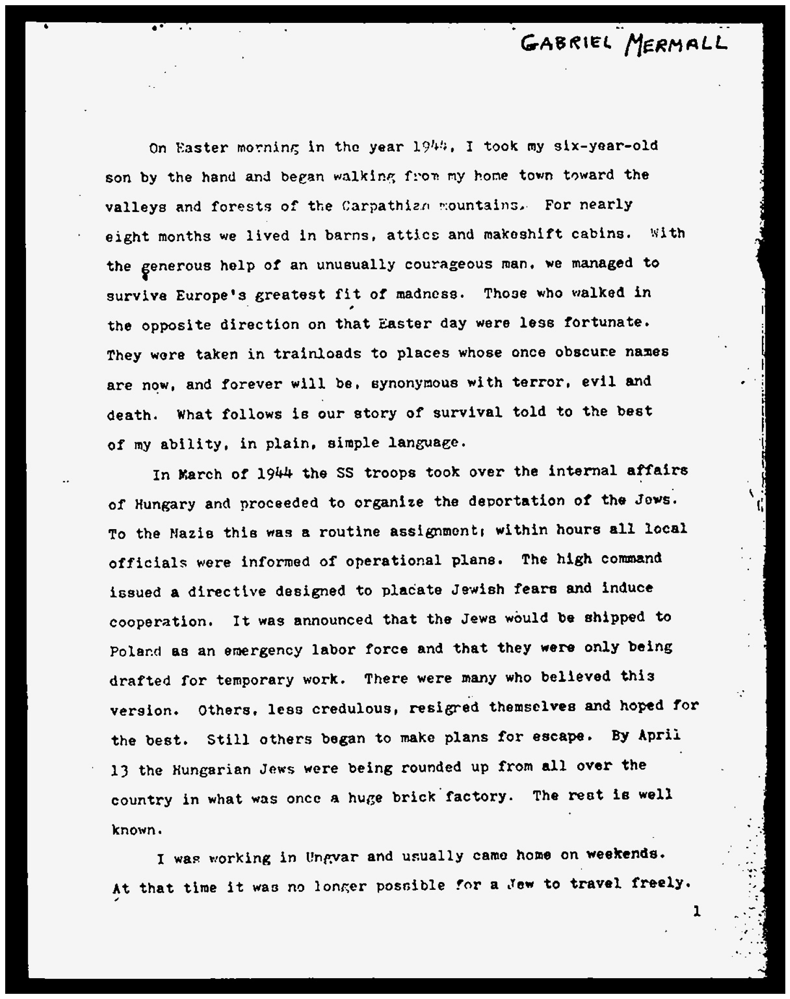

In [14]:
display("no_noise.jpg")


In [15]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

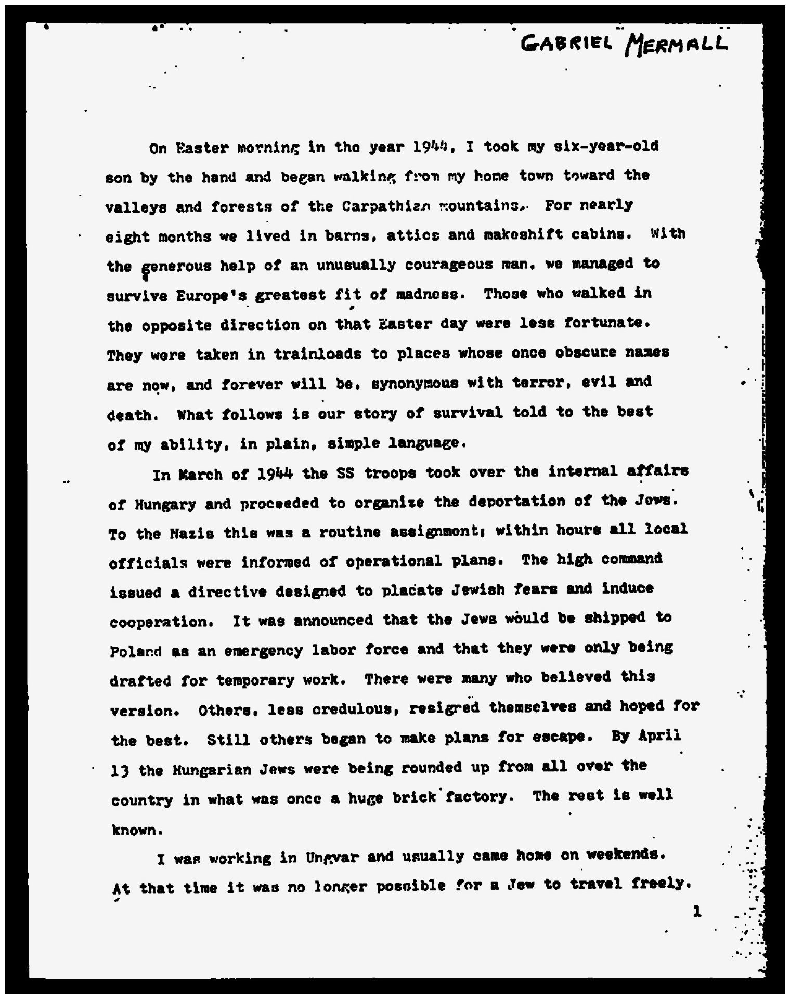

In [16]:
dilated_image = thick_font(no_noise)
cv2.imwrite("dilated_image.jpg", dilated_image)
display("dilated_image.jpg")

In [17]:
import pytesseract
from PIL import Image

In [18]:
img = Image.open("dilated_image.jpg")
pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
ocr_result = pytesseract.image_to_string(img)


In [19]:
if len(ocr_result) == 0:
    print("non recognisable")
else:
    print(ocr_result)

“GABRIEL Mermall

On Easter morning in the year 194%, I took my six-year-old
gon by the hand and began walking fron my home town toward the
valleys and forests of the Carpathizn mountains.. For nearly
eight months we lived in barns, attics and makeshift cabins. With
the generous help of an unusually courageous man, we managed to
survive Europe's greatest fit of madness. Those who walked in
the opposite direction on that Easter day were lese fortunate.
They wore taken in trainloads to places whose once obscure nazes
are now, and forever will be, synonymous with terror, evil and
death. What follows is our story of survival told to the best
of my ability, in plain, simple language.

In March of 194% the SS troops took over the internal affairs
of Hungary and proceeded to organize the deportation of the Jows.
To the Mazis thie was a routine assignmont; within hours all local
officials were informed of operational plans. The high command
issued a directive designed to placate Jewish fears a